In [1]:
import pandas as pd

In [3]:
import requests

In [14]:
# Extract from API using requests

url1 = "https://ghoapi.azureedge.net/api/NCD_BMI_30C"
url2 = "https://ghoapi.azureedge.net/api/NCD_BMI_PLUS2C"
url3 = "https://ghoapi.azureedge.net/api/NCD_BMI_18C"
url4 = "https://ghoapi.azureedge.net/api/NCD_BMI_MINUS2C"

response1 = requests.get(url1)
response2 = requests.get(url2)
response3 = requests.get(url3)
response4 = requests.get(url4)

data1 = response1.json()

In [15]:
data1

{'@odata.context': 'https://ghoapi.azureedge.net/api/$metadata#NCD_BMI_30C',
 'value': [{'Id': 257,
   'IndicatorCode': 'NCD_BMI_30C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'KHM',
   'ParentLocationCode': 'WPR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'Western Pacific',
   'Dim1Type': 'SEX',
   'TimeDim': 2001,
   'Dim1': 'SEX_BTSX',
   'Dim2Type': 'AGEGROUP',
   'Dim2': 'AGEGROUP_YEARS18-PLUS',
   'Dim3Type': None,
   'Dim3': None,
   'DataSourceDimType': None,
   'DataSourceDim': None,
   'Value': '1.0 [0.8-1.3]',
   'NumericValue': 0.9817,
   'Low': 0.75674,
   'High': 1.27487,
   'Comments': None,
   'Date': '2024-02-29T16:06:41.017+01:00',
   'TimeDimensionValue': '2001',
   'TimeDimensionBegin': '2001-01-01T00:00:00+01:00',
   'TimeDimensionEnd': '2001-12-31T00:00:00+01:00'},
  {'Id': 349,
   'IndicatorCode': 'NCD_BMI_30C',
   'SpatialDimType': 'COUNTRY',
   'SpatialDim': 'IRN',
   'ParentLocationCode': 'EMR',
   'TimeDimType': 'YEAR',
   'ParentLocation': 'East

In [18]:
data1.keys()

dict_keys(['@odata.context', 'value'])

In [132]:
data1 = response1.json() ["value"]
data2 = response2.json() ["value"]
data3 = response3.json() ["value"]
data4 = response4.json() ["value"]

In [134]:
# convert into DataFrame and add age group column

df1 = pd.DataFrame(data1)
df1["age_group"] = "adults"

df2 = pd.DataFrame(data2)
df2["age_group"] = "children"

df3 = pd.DataFrame(data3)
df3["age_group"] = "adults"

df4 = pd.DataFrame(data4)
df4["age_group"] = "children"

In [136]:
#combine datasets of obese age group and malnutrition age group

df_obesity = pd.concat([df1, df2])
df_malnutrition = pd.concat([df3, df4])

In [144]:
df_obesity.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,257,NCD_BMI_30C,COUNTRY,KHM,WPR,YEAR,Western Pacific,SEX,2001,SEX_BTSX,...,1.0 [0.8-1.3],0.98170,0.75674,1.27487,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
1,349,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,17.5 [15.8-19.2],17.48764,15.79378,19.24573,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
2,807,NCD_BMI_30C,COUNTRY,TJK,EUR,YEAR,Europe,SEX,1995,SEX_FMLE,...,7.9 [5.8-10.4],7.90484,5.78327,10.38715,None,2024-02-29T16:06:41.017+01:00,1995,1995-01-01T00:00:00+01:00,1995-12-31T00:00:00+01:00,adults
3,1049,NCD_BMI_30C,COUNTRY,WSM,WPR,YEAR,Western Pacific,SEX,2003,SEX_BTSX,...,46.6 [44.6-48.7],46.62329,44.61686,48.69747,None,2024-02-29T16:06:41.017+01:00,2003,2003-01-01T00:00:00+01:00,2003-12-31T00:00:00+01:00,adults
4,1196,NCD_BMI_30C,COUNTRY,NIU,WPR,YEAR,Western Pacific,SEX,2000,SEX_BTSX,...,54.6 [49.4-59.8],54.64320,49.43577,59.77076,None,2024-02-29T16:06:41.017+01:00,2000,2000-01-01T00:00:00+01:00,2000-12-31T00:00:00+01:00,adults


In [142]:
df_malnutrition.head()

,Id,IndicatorCode,SpatialDimType,SpatialDim,TimeDimType,ParentLocationCode,ParentLocation,Dim1Type,Dim1,TimeDim,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,53,NCD_BMI_18C,COUNTRY,GAB,YEAR,AFR,Africa,SEX,SEX_FMLE,2021,...,5.8 [4.0-8.1],5.79511,3.97204,8.07702,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
1,404,NCD_BMI_18C,COUNTRY,TUV,YEAR,WPR,Western Pacific,SEX,SEX_BTSX,2001,...,0.9 [0.4-1.9],0.93657,0.36515,1.85929,None,2024-02-29T16:06:41.017+01:00,2001,2001-01-01T00:00:00+01:00,2001-12-31T00:00:00+01:00,adults
2,1627,NCD_BMI_18C,COUNTRY,GHA,YEAR,AFR,Africa,SEX,SEX_MLE,2002,...,13.2 [10.0-16.7],13.20428,10.04854,16.71203,None,2024-02-29T16:06:41.017+01:00,2002,2002-01-01T00:00:00+01:00,2002-12-31T00:00:00+01:00,adults
3,1997,NCD_BMI_18C,COUNTRY,TCD,YEAR,AFR,Africa,SEX,SEX_BTSX,1990,...,23.2 [17.8-29.0],23.20135,17.80808,28.99020,None,2024-02-29T16:06:41.017+01:00,1990,1990-01-01T00:00:00+01:00,1990-12-31T00:00:00+01:00,adults
4,2197,NCD_BMI_18C,COUNTRY,MNG,YEAR,WPR,Western Pacific,SEX,SEX_BTSX,2017,...,3.1 [2.4-3.8],3.09065,2.42823,3.84215,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00,adults


In [148]:
df_obesity.columns

Index(['Id', 'IndicatorCode', 'SpatialDimType', 'SpatialDim',
       'ParentLocationCode', 'TimeDimType', 'ParentLocation', 'Dim1Type',
       'TimeDim', 'Dim1', 'Dim2Type', 'Dim2', 'Dim3Type', 'Dim3',
       'DataSourceDimType', 'DataSourceDim', 'Value', 'NumericValue', 'Low',
       'High', 'Comments', 'Date', 'TimeDimensionValue', 'TimeDimensionBegin',
       'TimeDimensionEnd', 'age_group'],
      dtype='object')

In [150]:
df_malnutrition.columns

Index(['Id', 'IndicatorCode', 'SpatialDimType', 'SpatialDim', 'TimeDimType',
       'ParentLocationCode', 'ParentLocation', 'Dim1Type', 'Dim1', 'TimeDim',
       'Dim2Type', 'Dim2', 'Dim3Type', 'Dim3', 'DataSourceDimType',
       'DataSourceDim', 'Value', 'NumericValue', 'Low', 'High', 'Comments',
       'Date', 'TimeDimensionValue', 'TimeDimensionBegin', 'TimeDimensionEnd',
       'age_group'],
      dtype='object')

In [154]:
df_obesity.info()

<class 'pandas.core.frame.DataFrame'>
Index: 83160 entries, 0 to 62369
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  83160 non-null  int64  
 1   IndicatorCode       83160 non-null  object 
 2   SpatialDimType      83160 non-null  object 
 3   SpatialDim          83160 non-null  object 
 4   ParentLocationCode  78804 non-null  object 
 5   TimeDimType         83160 non-null  object 
 6   ParentLocation      78804 non-null  object 
 7   Dim1Type            83160 non-null  object 
 8   TimeDim             83160 non-null  int64  
 9   Dim1                83160 non-null  object 
 10  Dim2Type            83160 non-null  object 
 11  Dim2                83160 non-null  object 
 12  Dim3Type            0 non-null      object 
 13  Dim3                0 non-null      object 
 14  DataSourceDimType   0 non-null      object 
 15  DataSourceDim       0 non-null      object 
 16  Value    

In [156]:
# filter from 2012 to 2022

df_obesity_filtered = df_obesity[(df_obesity ["TimeDim"] >= 2012) & (df_obesity["TimeDim"] <= 2022)]
df_malnutrition_filtered = df_malnutrition[(df_malnutrition ["TimeDim"] >= 2012) & (df_malnutrition["TimeDim"] <= 2022)]

In [54]:
df_obesity_filtered

,Id,IndicatorCode,SpatialDimType,SpatialDim,ParentLocationCode,TimeDimType,ParentLocation,Dim1Type,TimeDim,Dim1,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
1,349,NCD_BMI_30C,COUNTRY,IRN,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,17.5 [15.8-19.2],17.48764,15.79378,19.24573,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
8,4742,NCD_BMI_30C,COUNTRY,IRQ,EMR,YEAR,Eastern Mediterranean,SEX,2020,SEX_MLE,...,28.3 [23.1-33.8],28.33553,23.08959,33.81534,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,adults
14,6288,NCD_BMI_30C,COUNTRY,GRL,EUR,YEAR,Europe,SEX,2014,SEX_FMLE,...,27.9 [24.9-31.2],27.94870,24.92477,31.21326,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,adults
16,7503,NCD_BMI_30C,COUNTRY,ARM,EUR,YEAR,Europe,SEX,2019,SEX_FMLE,...,31.9 [28.2-35.6],31.89322,28.16068,35.57493,None,2024-02-29T16:06:41.017+01:00,2019,2019-01-01T00:00:00+01:00,2019-12-31T00:00:00+01:00,adults
17,8532,NCD_BMI_30C,COUNTRY,MLT,EUR,YEAR,Europe,SEX,2018,SEX_BTSX,...,33.7 [29.9-37.5],33.69421,29.90581,37.47086,None,2024-02-29T16:06:41.017+01:00,2018,2018-01-01T00:00:00+01:00,2018-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62347,9728747,NCD_BMI_PLUS2C,COUNTRY,TJK,EUR,YEAR,Europe,SEX,2020,SEX_BTSX,...,1.5 [1.0-2.2],1.47593,0.96418,2.19743,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,children
62350,9729605,NCD_BMI_PLUS2C,COUNTRY,SOM,EMR,YEAR,Eastern Mediterranean,SEX,2012,SEX_FMLE,...,2.0 [0.3-5.9],1.96619,0.30204,5.87241,None,2024-02-29T16:06:41.017+01:00,2012,2012-01-01T00:00:00+01:00,2012-12-31T00:00:00+01:00,children
62358,9731082,NCD_BMI_PLUS2C,COUNTRY,VUT,WPR,YEAR,Western Pacific,SEX,2021,SEX_MLE,...,16.6 [3.3-34.9],16.63489,3.32590,34.87782,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,children
62361,9731531,NCD_BMI_PLUS2C,COUNTRY,MDG,AFR,YEAR,Africa,SEX,2014,SEX_MLE,...,2.0 [0.2-6.3],2.03219,0.23648,6.34118,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,children


In [158]:
df_malnutrition_filtered

,Id,IndicatorCode,SpatialDimType,SpatialDim,TimeDimType,ParentLocationCode,ParentLocation,Dim1Type,Dim1,TimeDim,...,Value,NumericValue,Low,High,Comments,Date,TimeDimensionValue,TimeDimensionBegin,TimeDimensionEnd,age_group
0,53,NCD_BMI_18C,COUNTRY,GAB,YEAR,AFR,Africa,SEX,SEX_FMLE,2021,...,5.8 [4.0-8.1],5.79511,3.97204,8.07702,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
4,2197,NCD_BMI_18C,COUNTRY,MNG,YEAR,WPR,Western Pacific,SEX,SEX_BTSX,2017,...,3.1 [2.4-3.8],3.09065,2.42823,3.84215,None,2024-02-29T16:06:41.017+01:00,2017,2017-01-01T00:00:00+01:00,2017-12-31T00:00:00+01:00,adults
5,2499,NCD_BMI_18C,COUNTRY,SLE,YEAR,AFR,Africa,SEX,SEX_FMLE,2016,...,8.4 [6.7-10.3],8.37172,6.65567,10.25312,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00,adults
7,3970,NCD_BMI_18C,REGION,SEAR,YEAR,None,None,SEX,SEX_BTSX,2021,...,13.3 [12.2-14.4],13.33635,12.24232,14.44287,None,2024-02-29T16:06:41.017+01:00,2021,2021-01-01T00:00:00+01:00,2021-12-31T00:00:00+01:00,adults
9,4835,NCD_BMI_18C,COUNTRY,QAT,YEAR,EMR,Eastern Mediterranean,SEX,SEX_MLE,2014,...,2.2 [1.3-3.5],2.20807,1.25384,3.51682,None,2024-02-29T16:06:41.017+01:00,2014,2014-01-01T00:00:00+01:00,2014-12-31T00:00:00+01:00,adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62357,9729498,NCD_BMI_MINUS2C,COUNTRY,HTI,YEAR,AMR,Americas,SEX,SEX_FMLE,2013,...,4.1 [2.8-5.7],4.14069,2.79550,5.71434,None,2024-02-29T16:06:41.017+01:00,2013,2013-01-01T00:00:00+01:00,2013-12-31T00:00:00+01:00,children
62359,9730468,NCD_BMI_MINUS2C,COUNTRY,TJK,YEAR,EUR,Europe,SEX,SEX_BTSX,2018,...,7.6 [5.4-10.2],7.57499,5.42817,10.21840,None,2024-02-29T16:06:41.017+01:00,2018,2018-01-01T00:00:00+01:00,2018-12-31T00:00:00+01:00,children
62360,9730611,NCD_BMI_MINUS2C,COUNTRY,PNG,YEAR,WPR,Western Pacific,SEX,SEX_BTSX,2016,...,1.7 [0.6-3.5],1.70365,0.62172,3.50706,None,2024-02-29T16:06:41.017+01:00,2016,2016-01-01T00:00:00+01:00,2016-12-31T00:00:00+01:00,children
62366,9731703,NCD_BMI_MINUS2C,COUNTRY,WSM,YEAR,WPR,Western Pacific,SEX,SEX_FMLE,2020,...,0.7 [0.1-2.8],0.73407,0.06415,2.81018,None,2024-02-29T16:06:41.017+01:00,2020,2020-01-01T00:00:00+01:00,2020-12-31T00:00:00+01:00,children


In [160]:
# Retain required columns

required_columns = ["ParentLocation", "Dim1", "TimeDim", "Low", "High", "NumericValue", "SpatialDim", "age_group"]

df_obesity_filtered = df_obesity_filtered[required_columns]
df_malnutrition_filtered = df_malnutrition_filtered[required_columns]

In [162]:
df_obesity_filtered

,ParentLocation,Dim1,TimeDim,Low,High,NumericValue,SpatialDim,age_group
1,Eastern Mediterranean,SEX_MLE,2020,15.79378,19.24573,17.48764,IRN,adults
8,Eastern Mediterranean,SEX_MLE,2020,23.08959,33.81534,28.33553,IRQ,adults
14,Europe,SEX_FMLE,2014,24.92477,31.21326,27.94870,GRL,adults
16,Europe,SEX_FMLE,2019,28.16068,35.57493,31.89322,ARM,adults
17,Europe,SEX_BTSX,2018,29.90581,37.47086,33.69421,MLT,adults
...,...,...,...,...,...,...,...,...
62347,Europe,SEX_BTSX,2020,0.96418,2.19743,1.47593,TJK,children
62350,Eastern Mediterranean,SEX_FMLE,2012,0.30204,5.87241,1.96619,SOM,children
62358,Western Pacific,SEX_MLE,2021,3.32590,34.87782,16.63489,VUT,children
62361,Africa,SEX_MLE,2014,0.23648,6.34118,2.03219,MDG,children


In [164]:
df_malnutrition_filtered

,ParentLocation,Dim1,TimeDim,Low,High,NumericValue,SpatialDim,age_group
0,Africa,SEX_FMLE,2021,3.97204,8.07702,5.79511,GAB,adults
4,Western Pacific,SEX_BTSX,2017,2.42823,3.84215,3.09065,MNG,adults
5,Africa,SEX_FMLE,2016,6.65567,10.25312,8.37172,SLE,adults
7,None,SEX_BTSX,2021,12.24232,14.44287,13.33635,SEAR,adults
9,Eastern Mediterranean,SEX_MLE,2014,1.25384,3.51682,2.20807,QAT,adults
...,...,...,...,...,...,...,...,...
62357,Americas,SEX_FMLE,2013,2.79550,5.71434,4.14069,HTI,children
62359,Europe,SEX_BTSX,2018,5.42817,10.21840,7.57499,TJK,children
62360,Western Pacific,SEX_BTSX,2016,0.62172,3.50706,1.70365,PNG,children
62366,Western Pacific,SEX_FMLE,2020,0.06415,2.81018,0.73407,WSM,children


In [168]:
df_obese = df_obesity_filtered.rename(columns = {
    "ParentLocation" : "Region",
    "Dim1" : "Gender",
    "TimeDim" : "Year",
    "Low" : "LowerBound",
    "High" : "UpperBound",
    "NumericValue" : "Mean_Estimate",
    "SpatialDim" : "Country",
})

In [170]:
df_obese

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group
1,Eastern Mediterranean,SEX_MLE,2020,15.79378,19.24573,17.48764,IRN,adults
8,Eastern Mediterranean,SEX_MLE,2020,23.08959,33.81534,28.33553,IRQ,adults
14,Europe,SEX_FMLE,2014,24.92477,31.21326,27.94870,GRL,adults
16,Europe,SEX_FMLE,2019,28.16068,35.57493,31.89322,ARM,adults
17,Europe,SEX_BTSX,2018,29.90581,37.47086,33.69421,MLT,adults
...,...,...,...,...,...,...,...,...
62347,Europe,SEX_BTSX,2020,0.96418,2.19743,1.47593,TJK,children
62350,Eastern Mediterranean,SEX_FMLE,2012,0.30204,5.87241,1.96619,SOM,children
62358,Western Pacific,SEX_MLE,2021,3.32590,34.87782,16.63489,VUT,children
62361,Africa,SEX_MLE,2014,0.23648,6.34118,2.03219,MDG,children


In [172]:
df_malnutri = df_malnutrition_filtered.rename(columns = {
    "ParentLocation" : "Region",
    "Dim1" : "Gender",
    "TimeDim" : "Year",
    "Low" : "LowerBound",
    "High" : "UpperBound",
    "NumericValue" : "Mean_Estimate",
    "SpatialDim" : "Country"
})

In [174]:
df_malnutri

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group
0,Africa,SEX_FMLE,2021,3.97204,8.07702,5.79511,GAB,adults
4,Western Pacific,SEX_BTSX,2017,2.42823,3.84215,3.09065,MNG,adults
5,Africa,SEX_FMLE,2016,6.65567,10.25312,8.37172,SLE,adults
7,None,SEX_BTSX,2021,12.24232,14.44287,13.33635,SEAR,adults
9,Eastern Mediterranean,SEX_MLE,2014,1.25384,3.51682,2.20807,QAT,adults
...,...,...,...,...,...,...,...,...
62357,Americas,SEX_FMLE,2013,2.79550,5.71434,4.14069,HTI,children
62359,Europe,SEX_BTSX,2018,5.42817,10.21840,7.57499,TJK,children
62360,Western Pacific,SEX_BTSX,2016,0.62172,3.50706,1.70365,PNG,children
62366,Western Pacific,SEX_FMLE,2020,0.06415,2.81018,0.73407,WSM,children


In [292]:
df_obese['Gender'] = df_obese['Gender'].replace({
    'SEX_FMLE': 'Female',
    'SEX_MLE': 'Male',
    'SEX_BTSX': 'Both'
})

In [294]:
df_malnutri['Gender'] = df_malnutri['Gender'].replace({
    'SEX_FMLE': 'Female',
    'SEX_MLE': 'Male',
    'SEX_BTSX': 'Both'
})

In [72]:
#convert country code to full name using pycountry

!pip install pycountry

   ---------------------------------------- 0.0/6.3 MB ? eta -:--:--
   ------------------------ --------------- 3.9/6.3 MB 29.4 MB/s eta 0:00:01
   ---------------------------------------- 6.3/6.3 MB 29.8 MB/s eta 0:00:00


In [74]:
import pycountry

In [76]:
#handle special cases

special_cases = {
                    'GLOBAL': 'Global',
                    'WB_LMI': 'Low & Middle Income',
                    'WB_HI': 'High Income',
                    'WB_LI': 'Low Income',
                    'EMR': 'Eastern Mediterranean Region',
                    'EUR': 'Europe',
                    'AFR': 'Africa',
                    'SEAR': 'South-East Asia Region',
                    'WPR': 'Western Pacific Region',
                    'AMR': 'Americas Region',
                    'WB_UMI': 'Upper Middle Income'}

In [296]:

def convert_country_code(code):
    if code in special_cases:
        return  special_cases[code]
    try:
        return pycountry.countries.get(alpha_3 = code).name
    except:
        return code


df_obese["Country"] = df_obese["Country"].apply(convert_country_code) 
df_malnutri["Country"] = df_malnutri["Country"].apply(convert_country_code)

In [298]:
df_obese

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
1,Eastern Mediterranean,Male,2020,15.79378,19.24573,17.48764,"Iran, Islamic Republic of",adults,3.45,Low
8,Eastern Mediterranean,Male,2020,23.08959,33.81534,28.33553,Iraq,adults,10.73,Moderate
14,Europe,Female,2014,24.92477,31.21326,27.94870,Greenland,adults,6.29,Moderate
16,Europe,Female,2019,28.16068,35.57493,31.89322,Armenia,adults,7.41,High
17,Europe,Both,2018,29.90581,37.47086,33.69421,Malta,adults,7.57,High
...,...,...,...,...,...,...,...,...,...,...
62347,Europe,Both,2020,0.96418,2.19743,1.47593,Tajikistan,children,1.23,Low
62350,Eastern Mediterranean,Female,2012,0.30204,5.87241,1.96619,Somalia,children,5.57,Low
62358,Western Pacific,Male,2021,3.32590,34.87782,16.63489,Vanuatu,children,31.55,Low
62361,Africa,Male,2014,0.23648,6.34118,2.03219,Madagascar,children,6.10,Low


In [300]:
df_malnutri

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,malnutrition_level
0,Africa,Female,2021,3.97204,8.07702,5.79511,Gabon,adults,4.10702,Low
4,Western Pacific,Both,2017,2.42823,3.84215,3.09065,Mongolia,adults,1.41215,Low
5,Africa,Female,2016,6.65567,10.25312,8.37172,Sierra Leone,adults,3.59312,Low
7,None,Both,2021,12.24232,14.44287,13.33635,South-East Asia Region,adults,2.20287,Moderate
9,Eastern Mediterranean,Male,2014,1.25384,3.51682,2.20807,Qatar,adults,2.26682,Low
...,...,...,...,...,...,...,...,...,...,...
62357,Americas,Female,2013,2.79550,5.71434,4.14069,Haiti,children,2.91434,Low
62359,Europe,Both,2018,5.42817,10.21840,7.57499,Tajikistan,children,4.78840,Low
62360,Western Pacific,Both,2016,0.62172,3.50706,1.70365,Papua New Guinea,children,2.88706,Low
62366,Western Pacific,Female,2020,0.06415,2.81018,0.73407,Samoa,children,2.75018,Low


In [302]:
# Calculate CI width

df_obese["CI_width"] = (df_obese["UpperBound"] - df_obese["LowerBound"]). round(2)
df_malnutri["CI_width"] = df_malnutri["UpperBound"] - df_malnutri["LowerBound"]. round(2)

In [304]:
# Add obesity level

def get_obesity_level(value):
    if value >= 30:
        return "High"
    elif value >=25 and value <=29.9:
        return "Moderate"
    else:
        return "Low"

df_obese["obesity_level"] = df_obese["Mean_Estimate"].apply(get_obesity_level)
    

In [306]:
# Add malnutrition level


def get_malnutrition_level(value):
    if value >= 20:
        return "High"
    elif value >= 10 and value <= 19.9:
        return "Moderate"
    else:
        return "Low"

df_malnutri["malnutrition_level"] = df_malnutri["Mean_Estimate"].apply(get_malnutrition_level)


In [308]:
df_obese

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
1,Eastern Mediterranean,Male,2020,15.79378,19.24573,17.48764,"Iran, Islamic Republic of",adults,3.45,Low
8,Eastern Mediterranean,Male,2020,23.08959,33.81534,28.33553,Iraq,adults,10.73,Moderate
14,Europe,Female,2014,24.92477,31.21326,27.94870,Greenland,adults,6.29,Moderate
16,Europe,Female,2019,28.16068,35.57493,31.89322,Armenia,adults,7.41,High
17,Europe,Both,2018,29.90581,37.47086,33.69421,Malta,adults,7.57,High
...,...,...,...,...,...,...,...,...,...,...
62347,Europe,Both,2020,0.96418,2.19743,1.47593,Tajikistan,children,1.23,Low
62350,Eastern Mediterranean,Female,2012,0.30204,5.87241,1.96619,Somalia,children,5.57,Low
62358,Western Pacific,Male,2021,3.32590,34.87782,16.63489,Vanuatu,children,31.55,Low
62361,Africa,Male,2014,0.23648,6.34118,2.03219,Madagascar,children,6.10,Low


In [310]:
df_malnutri

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,malnutrition_level
0,Africa,Female,2021,3.97204,8.07702,5.79511,Gabon,adults,4.10702,Low
4,Western Pacific,Both,2017,2.42823,3.84215,3.09065,Mongolia,adults,1.41215,Low
5,Africa,Female,2016,6.65567,10.25312,8.37172,Sierra Leone,adults,3.59312,Low
7,None,Both,2021,12.24232,14.44287,13.33635,South-East Asia Region,adults,2.20287,Moderate
9,Eastern Mediterranean,Male,2014,1.25384,3.51682,2.20807,Qatar,adults,2.26682,Low
...,...,...,...,...,...,...,...,...,...,...
62357,Americas,Female,2013,2.79550,5.71434,4.14069,Haiti,children,2.91434,Low
62359,Europe,Both,2018,5.42817,10.21840,7.57499,Tajikistan,children,4.78840,Low
62360,Western Pacific,Both,2016,0.62172,3.50706,1.70365,Papua New Guinea,children,2.88706,Low
62366,Western Pacific,Female,2020,0.06415,2.81018,0.73407,Samoa,children,2.75018,Low


# Shape and structure


In [312]:
df_obese.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27720 entries, 1 to 62364
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Region         26268 non-null  object 
 1   Gender         27720 non-null  object 
 2   Year           27720 non-null  int64  
 3   LowerBound     27720 non-null  float64
 4   UpperBound     27720 non-null  float64
 5   Mean_Estimate  27720 non-null  float64
 6   Country        27720 non-null  object 
 7   age_group      27720 non-null  object 
 8   CI_width       27720 non-null  float64
 9   obesity_level  27720 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.3+ MB


In [314]:
df_obese.columns


Index(['Region', 'Gender', 'Year', 'LowerBound', 'UpperBound', 'Mean_Estimate',
       'Country', 'age_group', 'CI_width', 'obesity_level'],
      dtype='object')

In [316]:
df_obese.head(10)


,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
1,Eastern Mediterranean,Male,2020,15.79378,19.24573,17.48764,"Iran, Islamic Republic of",adults,3.45,Low
8,Eastern Mediterranean,Male,2020,23.08959,33.81534,28.33553,Iraq,adults,10.73,Moderate
14,Europe,Female,2014,24.92477,31.21326,27.94870,Greenland,adults,6.29,Moderate
16,Europe,Female,2019,28.16068,35.57493,31.89322,Armenia,adults,7.41,High
17,Europe,Both,2018,29.90581,37.47086,33.69421,Malta,adults,7.57,High
20,Americas,Female,2021,37.52783,46.36891,41.91982,Panama,adults,8.84,High
21,South-East Asia,Both,2015,4.50571,5.06104,4.77845,India,adults,0.56,Low
23,Africa,Male,2015,1.29239,3.98972,2.37133,Madagascar,adults,2.70,Low
24,Africa,Both,2014,4.58348,6.64146,5.51619,Guinea,adults,2.06,Low
27,Western Pacific,Female,2018,7.14041,10.48312,8.74471,Philippines,adults,3.34,Low


In [318]:
df_obese.tail(10)


,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
62332,Europe,Male,2012,11.95117,16.47700,14.16916,Serbia,children,4.53,Low
62337,Eastern Mediterranean,Both,2015,1.78446,7.25130,3.93015,Sudan,children,5.47,Low
62339,Africa,Both,2012,0.66262,1.88628,1.17063,Malawi,children,1.22,Low
62342,Western Pacific,Female,2019,15.36764,19.28783,17.30899,New Zealand,children,3.92,Low
62344,Eastern Mediterranean,Both,2015,8.42559,13.32094,10.76390,Saudi Arabia,children,4.90,Low
62347,Europe,Both,2020,0.96418,2.19743,1.47593,Tajikistan,children,1.23,Low
62350,Eastern Mediterranean,Female,2012,0.30204,5.87241,1.96619,Somalia,children,5.57,Low
62358,Western Pacific,Male,2021,3.32590,34.87782,16.63489,Vanuatu,children,31.55,Low
62361,Africa,Male,2014,0.23648,6.34118,2.03219,Madagascar,children,6.10,Low
62364,Europe,Male,2017,10.08785,12.76015,11.39063,Finland,children,2.67,Low


In [320]:
df_obese.shape

(27720, 10)

In [322]:
df_malnutri.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27720 entries, 0 to 62369
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Region              26268 non-null  object 
 1   Gender              27720 non-null  object 
 2   Year                27720 non-null  int64  
 3   LowerBound          27720 non-null  float64
 4   UpperBound          27720 non-null  float64
 5   Mean_Estimate       27720 non-null  float64
 6   Country             27720 non-null  object 
 7   age_group           27720 non-null  object 
 8   CI_width            27720 non-null  float64
 9   malnutrition_level  27720 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.3+ MB


In [324]:
df_malnutri.columns

Index(['Region', 'Gender', 'Year', 'LowerBound', 'UpperBound', 'Mean_Estimate',
       'Country', 'age_group', 'CI_width', 'malnutrition_level'],
      dtype='object')

In [326]:
df_malnutri.shape

(27720, 10)

In [328]:
df_obese.iloc[10:20]

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
28,Eastern Mediterranean,Male,2014,4.40397,8.04362,6.08068,Yemen,adults,3.64,Low
31,Eastern Mediterranean,Male,2017,26.93601,32.26266,29.54862,Jordan,adults,5.33,Moderate
35,Africa,Male,2020,4.65844,10.55411,7.22761,Botswana,adults,5.90,Low
36,Western Pacific,Both,2014,29.88770,31.83109,30.86861,New Zealand,adults,1.94,High
47,Africa,Female,2016,20.83094,26.39559,23.53896,Mauritius,adults,5.56,Low
48,Europe,Both,2012,21.33206,26.94976,24.12328,Belarus,adults,5.62,Low
56,Europe,Both,2012,18.12728,21.31219,19.69495,Belgium,adults,3.18,Low
57,Africa,Both,2019,4.89455,6.16785,5.50560,Uganda,adults,1.27,Low
61,Europe,Both,2018,20.93098,35.44287,27.76966,North Macedonia,adults,14.51,Moderate
64,Western Pacific,Female,2021,72.34848,87.33046,80.31689,American Samoa,adults,14.98,High


In [330]:
df_obese.loc[8] #location based indexing

Region           Eastern Mediterranean
Gender                            Male
Year                              2020
LowerBound                    23.08959
UpperBound                    33.81534
Mean_Estimate                 28.33553
Country                           Iraq
age_group                       adults
CI_width                         10.73
obesity_level                 Moderate
Name: 8, dtype: object

In [332]:
df_obese.iloc[8] #integer position based indexing

Region            Africa
Gender              Both
Year                2014
LowerBound       4.58348
UpperBound       6.64146
Mean_Estimate    5.51619
Country           Guinea
age_group         adults
CI_width            2.06
obesity_level        Low
Name: 24, dtype: object

In [334]:
df_malnutri.loc[4:9]

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,malnutrition_level
4,Western Pacific,Both,2017,2.42823,3.84215,3.09065,Mongolia,adults,1.41215,Low
5,Africa,Female,2016,6.65567,10.25312,8.37172,Sierra Leone,adults,3.59312,Low
7,None,Both,2021,12.24232,14.44287,13.33635,South-East Asia Region,adults,2.20287,Moderate
9,Eastern Mediterranean,Male,2014,1.25384,3.51682,2.20807,Qatar,adults,2.26682,Low


In [278]:
df_malnutri.loc[:, "Country"]

0                         Gabon
4                      Mongolia
5                  Sierra Leone
7        South-East Asia Region
9                         Qatar
                  ...          
62357                     Haiti
62359                Tajikistan
62360          Papua New Guinea
62366                     Samoa
62369                   Iceland
Name: Country, Length: 27720, dtype: object

In [282]:
df_malnutri.iloc[:, 6]

0                         Gabon
4                      Mongolia
5                  Sierra Leone
7        South-East Asia Region
9                         Qatar
                  ...          
62357                     Haiti
62359                Tajikistan
62360          Papua New Guinea
62366                     Samoa
62369                   Iceland
Name: Country, Length: 27720, dtype: object

In [288]:
df_malnutri.loc[:, ["Country", "age_group"]]

,Country,age_group
0,Gabon,adults
4,Mongolia,adults
5,Sierra Leone,adults
7,South-East Asia Region,adults
9,Qatar,adults
...,...,...
62357,Haiti,children
62359,Tajikistan,children
62360,Papua New Guinea,children
62366,Samoa,children


In [336]:
df_malnutri.loc[:, "Gender"]

0        Female
4          Both
5        Female
7          Both
9          Male
          ...  
62357    Female
62359      Both
62360      Both
62366    Female
62369      Male
Name: Gender, Length: 27720, dtype: object

In [338]:
df_malnutri["age_group"].nunique()

2

In [340]:
df_obese["Gender"].nunique()

3

In [342]:
df_obese.describe()

,Year,LowerBound,UpperBound,Mean_Estimate,CI_width
count,27720.000000,27720.000000,27720.000000,27720.000000,27720.000000
mean,2017.000000,9.393155,17.068489,12.761041,7.675319
std,3.162335,9.893854,12.395013,10.858925,6.616917
min,2012.000000,0.077540,0.547850,0.265670,0.220000
25%,2014.000000,2.354430,7.875503,4.753960,2.930000
50%,2017.000000,6.506535,13.704380,9.944540,5.480000
75%,2020.000000,12.697755,23.986050,17.482418,10.340000
max,2022.000000,74.365370,87.868510,80.609250,40.550000


In [344]:
df_malnutri.describe()

,Year,LowerBound,UpperBound,Mean_Estimate,CI_width
count,27720.000000,27720.000000,27720.000000,27720.000000,27720.000000
mean,2017.000000,3.397094,8.147889,5.354451,4.750789
std,3.162335,3.908061,6.443692,4.811220,4.257672
min,2012.000000,0.023700,0.354830,0.175310,0.163110
25%,2014.000000,1.053662,3.143305,2.039283,1.602953
50%,2017.000000,1.907975,6.095555,3.597790,3.351280
75%,2020.000000,4.186443,11.526302,7.335245,6.530955
max,2022.000000,31.365400,43.680290,35.894110,26.696910


In [348]:
df_obese.dtypes

Region            object
Gender            object
Year               int64
LowerBound       float64
UpperBound       float64
Mean_Estimate    float64
Country           object
age_group         object
CI_width         float64
obesity_level     object
dtype: object

In [350]:
df_malnutri.dtypes

Region                 object
Gender                 object
Year                    int64
LowerBound            float64
UpperBound            float64
Mean_Estimate         float64
Country                object
age_group              object
CI_width              float64
malnutrition_level     object
dtype: object

In [352]:
df_obese.isnull()

,Region,Gender,Year,LowerBound,UpperBound,Mean_Estimate,Country,age_group,CI_width,obesity_level
1,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False
14,False,False,False,False,False,False,False,False,False,False
16,False,False,False,False,False,False,False,False,False,False
17,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
62347,False,False,False,False,False,False,False,False,False,False
62350,False,False,False,False,False,False,False,False,False,False
62358,False,False,False,False,False,False,False,False,False,False
62361,False,False,False,False,False,False,False,False,False,False


In [354]:
df_obese.isnull().sum()

Region           1452
Gender              0
Year                0
LowerBound          0
UpperBound          0
Mean_Estimate       0
Country             0
age_group           0
CI_width            0
obesity_level       0
dtype: int64

In [358]:
df_malnutri.isnull().sum()

Region                1452
Gender                   0
Year                     0
LowerBound               0
UpperBound               0
Mean_Estimate            0
Country                  0
age_group                0
CI_width                 0
malnutrition_level       0
dtype: int64

In [375]:
df_merged = pd.merge(df_obese, df_malnutri, how = 'inner', on = ["Country", "Region", "Gender", "Year", "age_group"], suffixes=('_obesity', '_malnutrition'))

In [377]:
df_merged

,Region,Gender,Year,LowerBound_obesity,UpperBound_obesity,Mean_Estimate_obesity,Country,age_group,CI_width_obesity,obesity_level,LowerBound_malnutrition,UpperBound_malnutrition,Mean_Estimate_malnutrition,CI_width_malnutrition,malnutrition_level
0,Eastern Mediterranean,Male,2020,15.79378,19.24573,17.48764,"Iran, Islamic Republic of",adults,3.45,Low,2.84711,4.63698,3.68788,1.78698,Low
1,Eastern Mediterranean,Male,2020,23.08959,33.81534,28.33553,Iraq,adults,10.73,Moderate,2.15087,6.92017,4.16498,4.77017,Low
2,Europe,Female,2014,24.92477,31.21326,27.94870,Greenland,adults,6.29,Moderate,2.37123,4.79047,3.45216,2.42047,Low
3,Europe,Female,2019,28.16068,35.57493,31.89322,Armenia,adults,7.41,High,1.77660,3.93823,2.69342,2.15823,Low
4,Europe,Both,2018,29.90581,37.47086,33.69421,Malta,adults,7.57,High,0.78215,2.30843,1.43181,1.52843,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69295,Africa,Male,2014,0.23648,6.34118,2.03219,Madagascar,children,6.10,Low,3.19101,19.20272,9.42691,16.01272,Low
69296,Africa,Male,2014,0.23648,6.34118,2.03219,Madagascar,children,6.10,Low,4.08950,22.13221,11.38286,18.04221,Moderate
69297,Europe,Male,2017,10.08785,12.76015,11.39063,Finland,children,2.67,Low,0.73302,1.15210,0.93052,0.42210,Low
69298,Europe,Male,2017,10.08785,12.76015,11.39063,Finland,children,2.67,Low,2.20904,3.34848,2.74607,1.13848,Low


In [379]:
merged_outer = pd.merge(df_obese, df_malnutri,
                        on=['Country', 'Year', 'Gender'],
                        how='outer',
                        indicator=True)

merged_outer['_merge'].value_counts()

_merge
both          110880
left_only          0
right_only         0
Name: count, dtype: int64

In [395]:
# Grouping

# Average value by country 

df_merged.groupby("Country") [["Mean_Estimate_obesity","Mean_Estimate_malnutrition"]].mean()

,Mean_Estimate_obesity,Mean_Estimate_malnutrition
Country,,
Afghanistan,6.710039,9.327605
Africa,3.777514,9.297004
Albania,8.612132,2.132155
Algeria,13.848312,4.230486
American Samoa,29.488044,0.822315
...,...,...
Viet Nam,4.576015,12.397459
Western Pacific Region,8.388376,5.121305
Yemen,8.549662,14.878938


In [391]:
df_merged.groupby("Country")[["Mean_Estimate_obesity","Mean_Estimate_malnutrition"]].mean().sort_values(by = "Mean_Estimate_obesity", ascending = False)

,Mean_Estimate_obesity,Mean_Estimate_malnutrition
Country,,
Niue,35.979912,0.739252
Cook Islands,34.786612,0.801736
Nauru,32.446237,0.760620
Tokelau,32.171236,0.972599
Tonga,30.754262,0.417109
...,...,...
Bangladesh,1.622612,18.377321
Rwanda,1.487050,6.024027
Ethiopia,1.443131,15.917430


In [407]:
df_obese.groupby(["Country", "age_group","Gender"]). agg(
    {
        "Year": "min",
        "Mean_Estimate": "min",
        "CI_width": "max"
    }
)

Year  Mean_Estimate  CI_width
Country     age_group Gender                               
Afghanistan adults    Both    2012        9.08931      5.56
                      Female  2012       10.70314      8.27
                      Male    2012        7.45478      7.30
            children  Both    2012        3.46892     13.28
                      Female  2012        3.10666     15.88
...                            ...            ...       ...
Zimbabwe    adults    Female  2012       13.28552      8.81
                      Male    2012        2.41981      3.76
            children  Both    2012        1.24581      7.27
                      Female  2012        1.76381      7.45
                      Male    2012        0.69537     12.44

[1260 rows x 3 columns]

In [419]:
df_malnutri.groupby(["Country", "age_group", "Gender"]).agg({
    "Year": "max",                  
    "Mean_Estimate": "mean",       
    "CI_width": "mean",           
    "malnutrition_level":"nunique" 
})

Year  Mean_Estimate  CI_width  \
Country     age_group Gender                                  
Afghanistan adults    Both    2022       8.945572  4.436224   
                      Female  2022       9.241027  5.068389   
                      Male    2022       8.647744  7.199921   
            children  Both    2022       9.419300  9.186582   
                      Female  2022       6.401617  6.485449   
...                            ...            ...       ...   
Zimbabwe    adults    Female  2022       5.256985  3.536545   
                      Male    2022       9.879170  6.645911   
            children  Both    2022       5.846035  5.029933   
                      Female  2022       2.685314  3.990497   
                      Male    2022       9.127202  9.217852   

                              malnutrition_level  
Country     age_group Gender                      
Afghanistan adults    Both                     2  
                      Female                   2  
                      Male                     2  
            children  Both                     2  
                      Female                   1  
...                                          ...  
Zimbabwe    adults    Female                   1  
                      Male                     2  
            children  Both                     1  
                      Female                   1  
                      Male                     2  

[1260 rows x 4 columns]

PIVOT TABLE

In [433]:
df_obese.pivot_table(index = ["Year", "age_group"] , columns = ["Country"] , values = "Mean_Estimate" , aggfunc = "mean")

Country         Afghanistan     Africa    Albania    Algeria  American Samoa  \
Year age_group                                                                 
2012 adults        9.082410   7.851283  19.046660  17.827387       72.416517   
     children      3.918966   2.514978   6.111430  10.970247       21.008831   
2013 adults        9.732387   8.070123  19.687897  18.437060       72.669570   
     children      4.232140   2.598053   6.272149  11.312013       21.670399   
2014 adults       10.429030   8.304090  20.350140  19.070683       72.943360   
     children      4.576290   2.693267   6.437010  11.689400       22.337283   
2015 adults       11.181233   8.557973  21.035330  19.726860       73.236690   
     children      4.955877   2.802880   6.602824  12.093319       23.020289   
2016 adults       11.986977   8.814440  21.753260  20.406053       73.552663   
     children      5.372853   2.929969   6.786227  12.523774       23.731943   
2017 adults       12.833657   9.078777  22.498900  21.078503       73.894030   
     children      5.828617   3.077410   6.988011  12.974877       24.467260   
2018 adults       13.717020   9.363880  23.266637  21.739280       74.230690   
     children      6.321467   3.247567   7.204171  13.435889       25.222154   
2019 adults       14.633907   9.662303  24.057470  22.394823       74.563123   
     children      6.848848   3.439970   7.437381  13.903994       25.994609   
2020 adults       15.583097   9.973740  24.865617  23.048290       74.885080   
     children      7.409219   3.654432   7.679531  14.380723       26.772779   
2021 adults       16.567077  10.296830  25.711093  23.697307       75.193173   
     children      8.000489   3.889160   7.922073  14.865553       27.542406   
2022 adults       17.583193  10.634473  26.566413  24.342553       75.445707   
     children      8.621266   4.143276   8.169759  15.355266       28.304736   

Country         Americas Region    Andorra     Angola  Antigua and Barbuda  \
Year age_group                                                               
2012 adults           27.686773  18.002077   7.569953            26.825443   
     children         13.746580  11.381831   2.494724            19.396308   
2013 adults           28.312700  18.279583   7.798523            27.485887   
     children         14.050703  11.392556   2.621393            19.946651   
2014 adults           28.948987  18.549487   8.038687            28.152077   
     children         14.369597  11.386611   2.760642            20.519221   
2015 adults           29.597153  18.816907   8.293100            28.818450   
     children         14.698361  11.379607   2.914509            21.087580   
2016 adults           30.253103  19.051213   8.559783            29.485140   
     children         15.038909  11.390947   3.086169            21.652566   
2017 adults           30.911797  19.253460   8.838903            30.162723   
     children         15.396578  11.419044   3.277991            22.233538   
2018 adults           31.573493  19.465140   9.131537            30.847733   
     children         15.764902  11.464156   3.490840            22.813474   
2019 adults           32.244677  19.684237   9.438280            31.544850   
     children         16.142461  11.520699   3.724216            23.389433   
2020 adults           32.928043  19.911190   9.759490            32.250027   
     children         16.522943  11.577210   3.978504            23.970064   
2021 adults           33.614910  20.151837  10.093523            32.959253   
     children         16.901691  11.632792   4.250591            24.542313   
2022 adults           34.309527  20.439123  10.439890            33.675947   
     children         17.280732  11.689346   4.541783            25.086221   

Country         Argentina  ...  Upper Middle Income    Uruguay  Uzbekistan  \
Year age_group             ...                                               
2012 adults     26.380223  ...            11.06245

In [435]:
df_obese.pivot_table(index = ["Year", "Region"] , columns = ["Gender"] , values = "CI_width" , aggfunc = "mean")

Gender                           Both     Female       Male
Year Region                                                
2012 Africa                  3.365691   4.128351   5.022713
     Americas                7.180811   8.994459  10.762905
     Eastern Mediterranean   5.379318   7.094659   7.772386
     Europe                  3.549087   4.425192   5.417933
     South-East Asia         3.072727   3.852727   4.546818
...                               ...        ...        ...
2022 Americas               12.756081  16.310405  18.981959
     Eastern Mediterranean  11.606477  14.470568  17.424545
     Europe                  6.562163   8.077308  10.116442
     South-East Asia         6.339091   7.972273   9.394091
     Western Pacific        12.136750  14.472417  18.816833

[66 rows x 3 columns]

In [437]:
df_malnutri.pivot_table(index = ["Year", "age_group"] , columns = ["Country"] , values = "Mean_Estimate" , aggfunc = "mean")

Country         Afghanistan     Africa   Albania   Algeria  American Samoa  \
Year age_group                                                               
2012 adults       11.753957  12.513253  1.338677  5.992723        0.258603   
     children     11.142297   9.139320  1.688344  4.289468        0.867382   
2013 adults       11.127843  12.356240  1.338057  5.787240        0.259967   
     children     10.765651   9.086703  1.757351  4.256322        0.868894   
2014 adults       10.521987  12.212433  1.336953  5.581747        0.261683   
     children     10.395082   9.044529  1.840150  4.225804        0.871993   
2015 adults        9.940380  12.082010  1.335190  5.379210        0.263740   
     children     10.031800   9.012519  1.937057  4.195508        0.875351   
2016 adults        9.381917  11.974420  1.330453  5.179450        0.266017   
     children      9.679804   8.991252  2.048496  4.166127        0.878234   
2017 adults        8.842900  11.883703  1.324450  4.987810        0.267690   
     children      9.332939   8.976564  2.168742  4.137958        0.880637   
2018 adults        8.324963  11.803350  1.317753  4.805097        0.271277   
     children      8.988747   8.962651  2.296723  4.108414        0.883710   
2019 adults        7.825920  11.737107  1.309943  4.637130        0.274487   
     children      8.652961   8.953284  2.436628  4.078752        0.887880   
2020 adults        7.343917  11.681763  1.303030  4.487523        0.278643   
     children      8.331011   8.949220  2.588359  4.051443        0.893532   
2021 adults        6.882980  11.633837  1.295317  4.356140        0.283473   
     children      8.022227   8.950701  2.752629  4.027941        0.900854   
2022 adults        6.445827  11.590107  1.289897  4.241177        0.291443   
     children      7.729036   8.955726  2.931891  4.008730        0.911262   

Country         Americas Region   Andorra     Angola  Antigua and Barbuda  \
Year age_group                                                              
2012 adults            2.364327  2.204517  11.404733             5.008847   
     children          1.878524  1.971103   7.337117             2.724334   
2013 adults            2.338753  2.192523  11.184773             4.957417   
     children          1.874137  2.008184   7.216021             2.727886   
2014 adults            2.315927  2.187557  10.979760             4.910737   
     children          1.876709  2.047403   7.105240             2.737644   
2015 adults            2.294963  2.188857  10.789473             4.871003   
     children          1.885423  2.091270   7.004687             2.752462   
2016 adults            2.275580  2.204523  10.614393             4.836613   
     children          1.899592  2.139896   6.912920             2.773893   
2017 adults            2.257660  2.234530  10.452570             4.801607   
     children          1.918569  2.189744   6.827980             2.801294   
2018 adults            2.240477  2.267150  10.304413             4.766937   
     children          1.942362  2.244702   6.748632             2.836022   
2019 adults            2.225207  2.303447  10.168460             4.733283   
     children          1.970733  2.306620   6.676757             2.877566   
2020 adults            2.214613  2.342880  10.044477             4.703060   
     children          2.003863  2.374594   6.611327             2.923753   
2021 adults            2.208433  2.383280   9.928570             4.677587   
     children          2.041556  2.448883   6.553234             2.974454   
2022 adults            2.205653  2.419877   9.819203             4.655837   
     children          2.083470  2.529047   6.501201             3.030423   

Country         Argentina  ...  Upper Middle Income   Uruguay  Uzbekistan  \
Year age_group             ...                                              
2012 adults      1.873540  ...             5.794237  2.485067    3.151627   
     children    1.674333  ...             4.67

In [439]:
df_malnutri.pivot_table(index = ["Year", "Region"] , columns = ["Gender"] , values = "CI_width" , aggfunc = "mean")

Gender                          Both    Female       Male
Year Region                                              
2012 Africa                 6.161208  5.896955  10.531007
     Americas               2.831964  3.492462   4.293104
     Eastern Mediterranean  4.485648  5.182962   7.065245
     Europe                 1.475140  2.009882   2.045533
     South-East Asia        6.229947  7.536847   9.564940
...                              ...       ...        ...
2022 Americas               4.226993  5.127419   6.466570
     Eastern Mediterranean  6.338220  7.777762   9.687992
     Europe                 2.488151  3.222148   3.576290
     South-East Asia        7.589790  9.488856  11.609101
     Western Pacific        3.273150  3.579003   5.218399

[66 rows x 3 columns]

In [449]:
df_merged.pivot_table(index = ["Country"] , columns = ["Gender"] , values = ["Mean_Estimate_obesity", "Mean_Estimate_malnutrition"] , aggfunc = "max")

Mean_Estimate_malnutrition                      \
Gender                                       Both    Female      Male   
Country                                                                 
Afghanistan                              11.99001  12.09548  15.94923   
Africa                                   12.50027  11.45614  14.92328   
Albania                                   3.14182   2.96475   3.31530   
Algeria                                   6.00312   5.10378   6.87127   
American Samoa                            1.07447   1.00619   1.14696   
...                                           ...       ...       ...   
Viet Nam                                 19.81689  20.83136  18.72951   
Western Pacific Region                    7.18082   8.56831   6.93753   
Yemen                                    16.31573  16.34275  20.76136   
Zambia                                   10.65158   9.04303  12.36542   
Zimbabwe                                  8.04040   5.56089  12.50034   

                       Mean_Estimate_obesity                      
Gender                                  Both    Female      Male  
Country                                                           
Afghanistan                         17.59419  21.79081  13.36458  
Africa                              10.68157  15.31774   6.19312  
Albania                             26.58335  29.83610  23.27979  
Algeria                             24.24859  32.92963  15.98631  
American Samoa                      75.55959  80.60925  70.16828  
...                                      ...       ...       ...  
Viet Nam                            11.03044   7.46635  14.23633  
Western Pacific Region              14.05312   9.73810  17.87689  
Yemen                               15.25084  14.22583  16.88758  
Zambia                               9.41690  14.42700   7.21125  
Zimbabwe                            12.42700  18.90789   4.46570  

[210 rows x 6 columns]

In [451]:
import seaborn as sns
import matplotlib.pyplot as plt

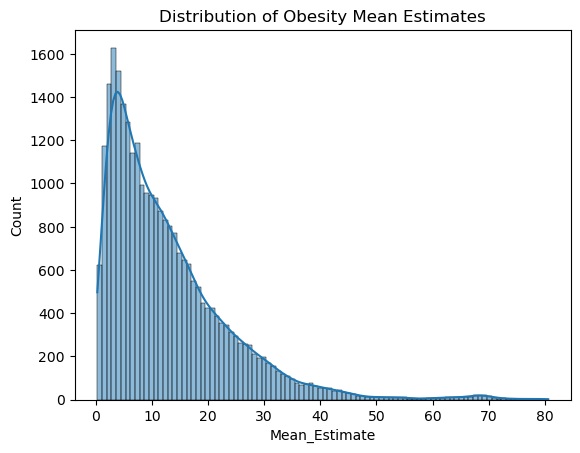

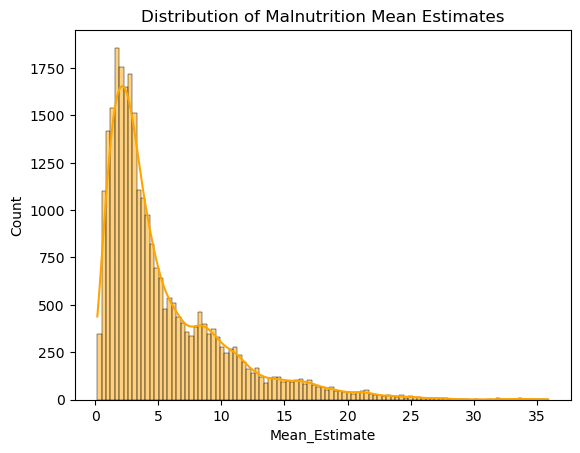

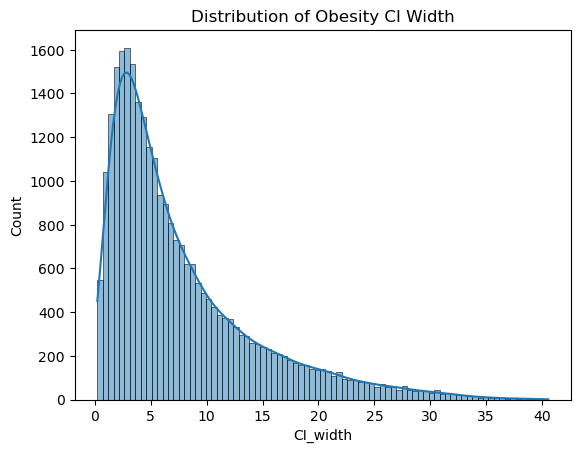

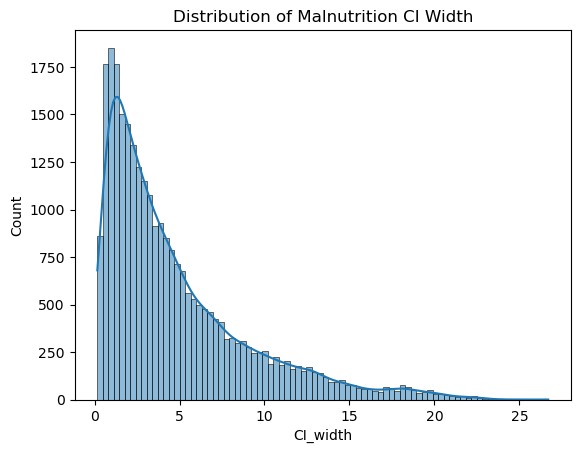

In [455]:
# Histogram + KDE for Mean_Estimate

sns.histplot(df_obese["Mean_Estimate"], kde=True)
plt.title("Distribution of Obesity Mean Estimates")
plt.show()

sns.histplot(df_malnutri["Mean_Estimate"], kde=True, color="orange")
plt.title("Distribution of Malnutrition Mean Estimates")
plt.show()

# CI Width
sns.histplot(df_obese["CI_width"], kde=True)
plt.title("Distribution of Obesity CI Width")
plt.show()

sns.histplot(df_malnutri["CI_width"], kde=True)
plt.title("Distribution of Malnutrition CI Width")
plt.show()

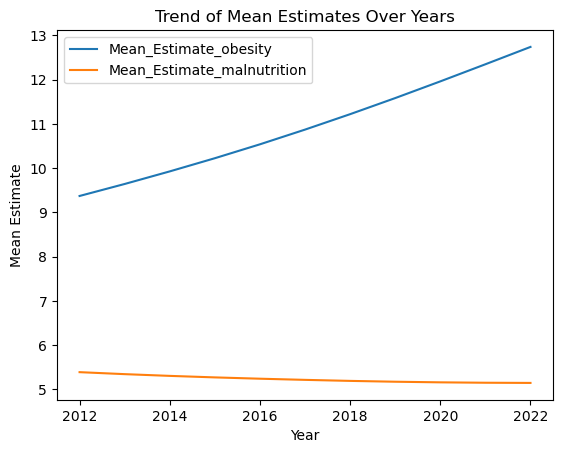

In [459]:
# Line plot over years

df_merged.groupby("Year")[["Mean_Estimate_obesity", "Mean_Estimate_malnutrition"]].mean().plot()
plt.title("Trend of Mean Estimates Over Years")
plt.ylabel("Mean Estimate")
plt.show()

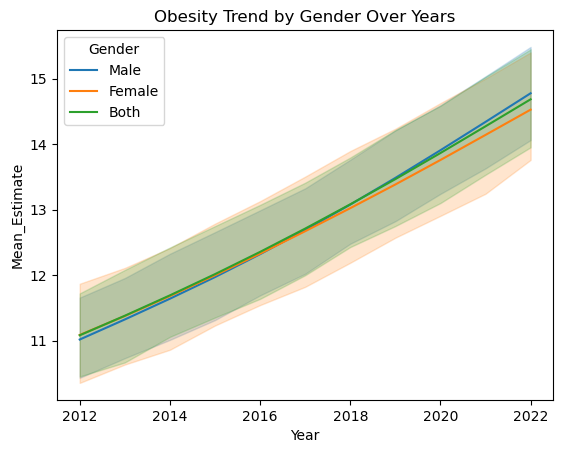

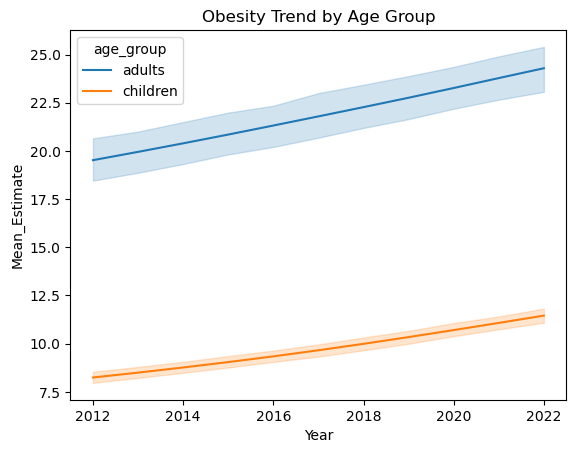

In [465]:
sns.lineplot(data=df_obese, x="Year", y="Mean_Estimate", hue="Gender")
plt.title("Obesity Trend by Gender Over Years")
plt.show()

sns.lineplot(data=df_obese, x="Year", y="Mean_Estimate", hue="age_group")
plt.title("Obesity Trend by Age Group")
plt.show()

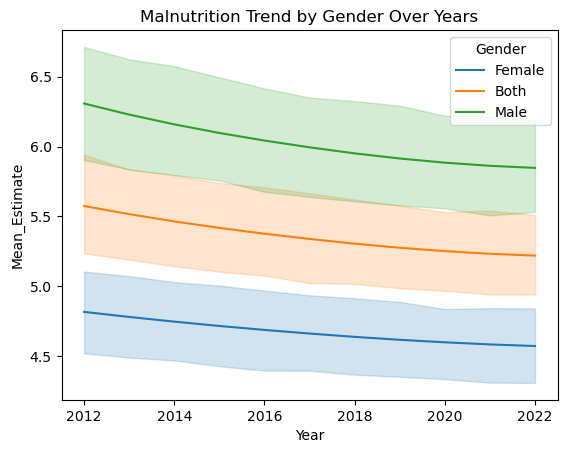

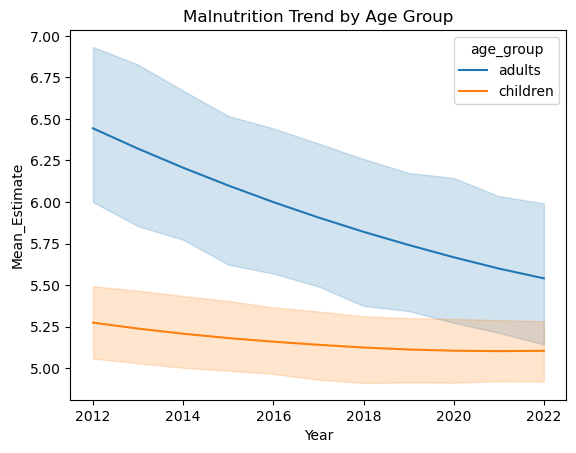

In [467]:
sns.lineplot(data=df_malnutri, x="Year", y="Mean_Estimate", hue="Gender")
plt.title("Malnutrition Trend by Gender Over Years")
plt.show()

sns.lineplot(data=df_malnutri, x="Year", y="Mean_Estimate", hue="age_group")
plt.title("Malnutrition Trend by Age Group")
plt.show()

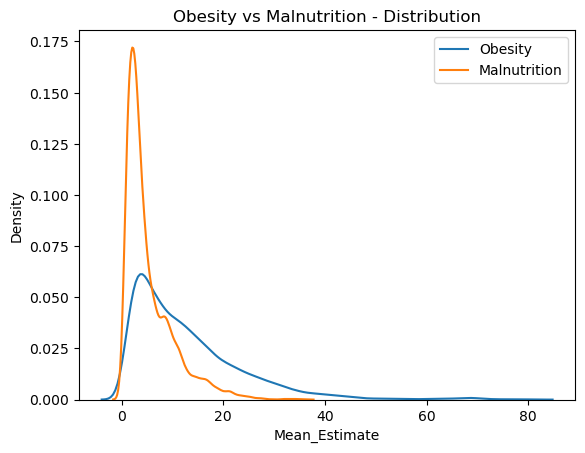

In [473]:
sns.kdeplot(df_obese["Mean_Estimate"], label="Obesity")
sns.kdeplot(df_malnutri["Mean_Estimate"], label="Malnutrition")
plt.title("Obesity vs Malnutrition - Distribution")
plt.legend()
plt.show()


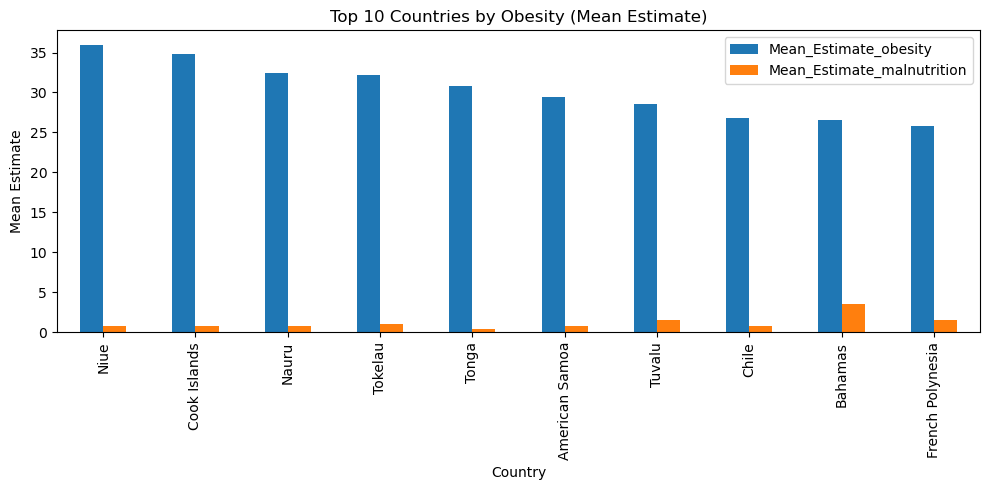

In [489]:
#Top 10 Countries

# Compute average by country
country_means = df_compare.groupby("Country")[["Mean_Estimate_obesity", "Mean_Estimate_malnutrition"]].mean()

# Top 10 countries by obesity
top_obese = country_means.sort_values(by="Mean_Estimate_obesity", ascending=False).head(10)

# Plot
top_obese.plot(kind="bar", figsize=(10,5))
plt.title("Top 10 Countries by Obesity (Mean Estimate)")
plt.ylabel("Mean Estimate")
plt.tight_layout()
plt.show()



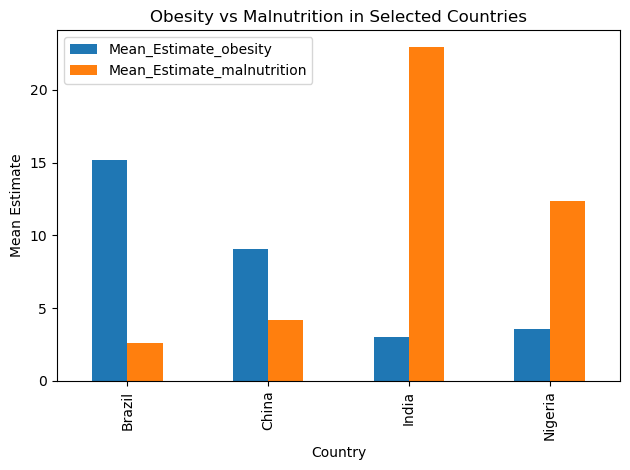

In [491]:
# Selected Countries

selected = ["India", "United States of America", "China", "Brazil", "Nigeria"]
df_selected = df_compare[df_compare["Country"].isin(selected)]

# Group and plot
df_selected.groupby("Country")[["Mean_Estimate_obesity", "Mean_Estimate_malnutrition"]].mean().plot(kind="bar")
plt.title("Obesity vs Malnutrition in Selected Countries")
plt.ylabel("Mean Estimate")
plt.tight_layout()
plt.show()


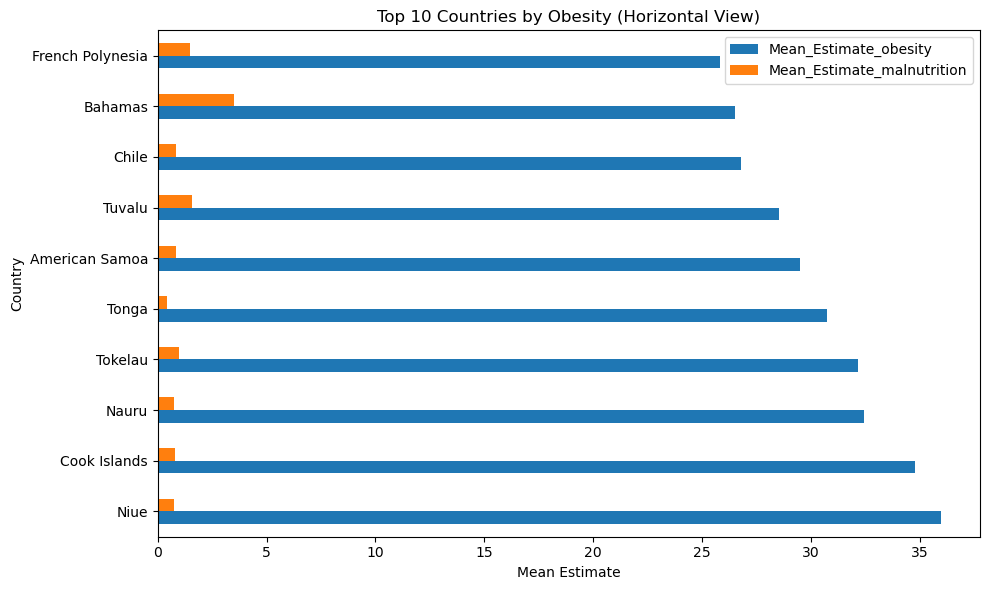

In [493]:
# Horizontal Bar Plot

top10 = country_means.sort_values(by="Mean_Estimate_obesity", ascending=False).head(10)
top10.plot(kind="barh", figsize=(10,6))
plt.title("Top 10 Countries by Obesity (Horizontal View)")
plt.xlabel("Mean Estimate")
plt.tight_layout()
plt.show()


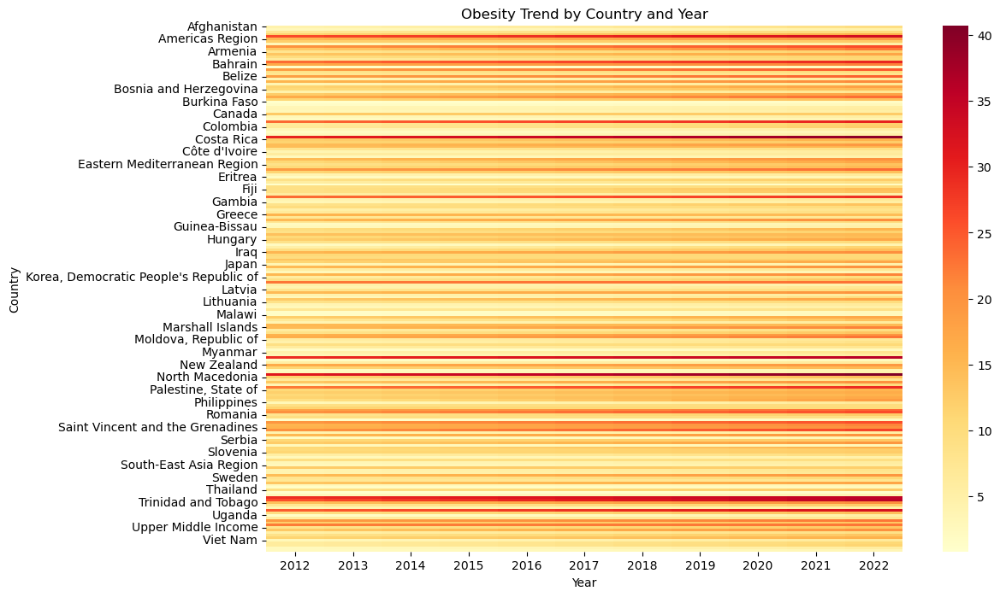

In [497]:
# Heatmap for Country vs Year

import seaborn as sns

pivot = df_compare.pivot_table(index='Country', columns='Year', values='Mean_Estimate_obesity')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot, cmap="YlOrRd")
plt.title("Obesity Trend by Country and Year")
plt.show()


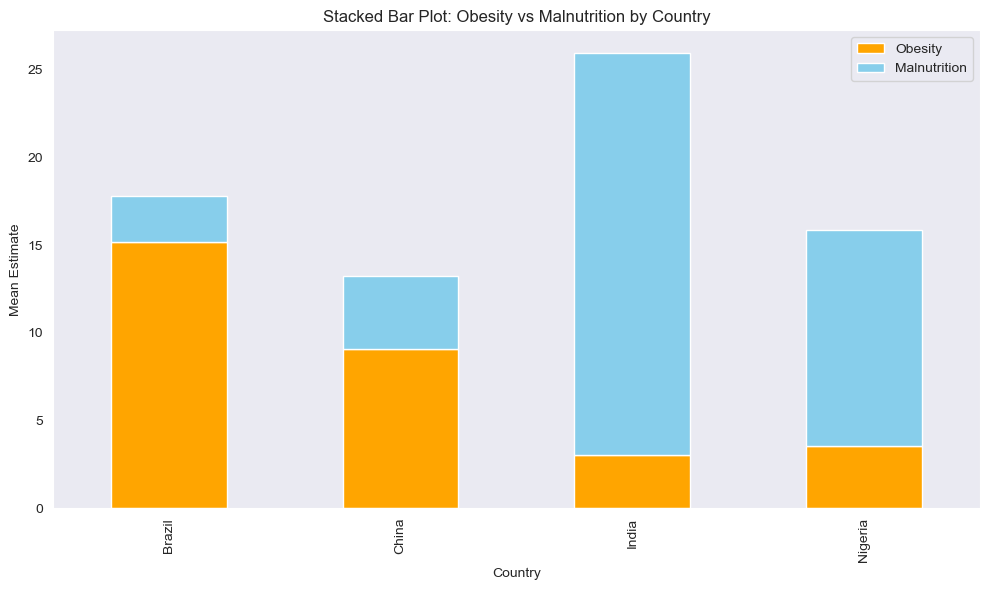

In [505]:
import matplotlib.pyplot as plt

# stacked bar for selected countries

# Prepare average values for a few countries
selected_countries = ['India', 'United States of America', 'Brazil', 'China', 'Nigeria']
df_selected = df_compare[df_compare['Country'].isin(selected_countries)]

# Group and aggregate
grouped = df_selected.groupby('Country')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean()

# Plot
grouped.plot(kind='bar', stacked=True, figsize=(10,6), color=['orange', 'skyblue'])

plt.title("Stacked Bar Plot: Obesity vs Malnutrition by Country")
plt.ylabel("Mean Estimate")
plt.xlabel("Country")
plt.legend(["Obesity", "Malnutrition"])
plt.tight_layout()
plt.show()


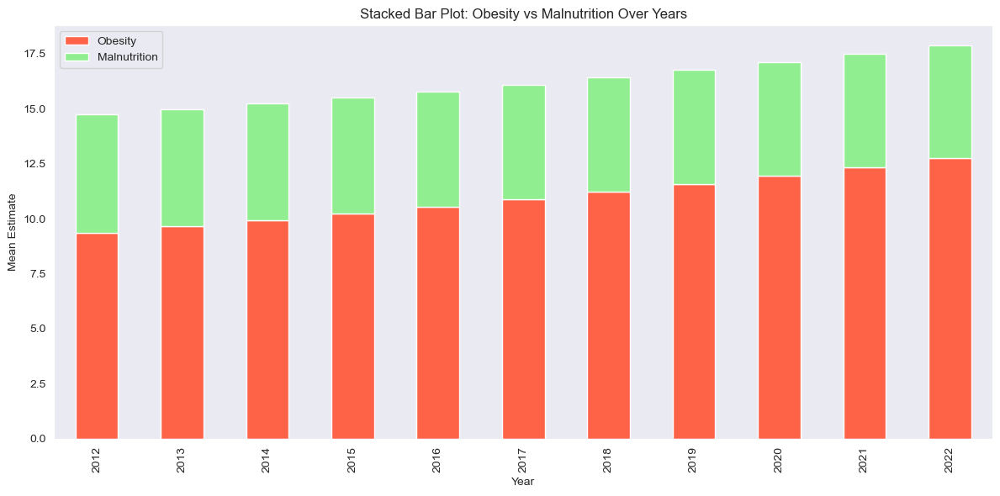

In [513]:
# stacked bar for each year

yearly = df_compare.groupby('Year')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean()

yearly.plot(kind='bar', stacked=True, figsize=(12,6), color=['tomato', 'lightgreen'])
plt.title("Stacked Bar Plot: Obesity vs Malnutrition Over Years")
plt.ylabel("Mean Estimate")
plt.xlabel("Year")
plt.legend(["Obesity", "Malnutrition"])
plt.tight_layout()
plt.show()


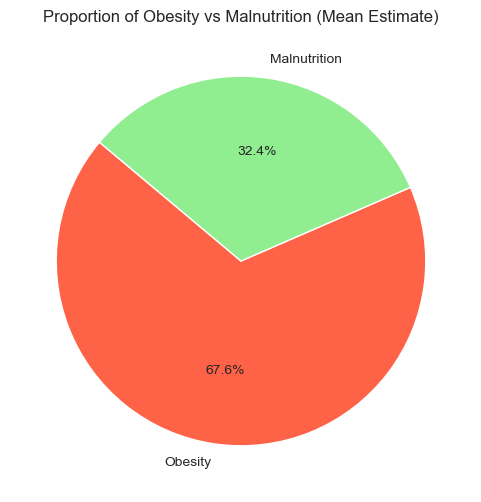

In [549]:
#Pie chart
import matplotlib.pyplot as plt


labels = ['Obesity', 'Malnutrition']
sizes = [df_merged['Mean_Estimate_obesity'].mean(), df_merged['Mean_Estimate_malnutrition'].mean()]

plt.figure(figsize=(6,6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=['tomato', 'lightgreen'], startangle=140)
plt.title('Proportion of Obesity vs Malnutrition (Mean Estimate)')
plt.show()


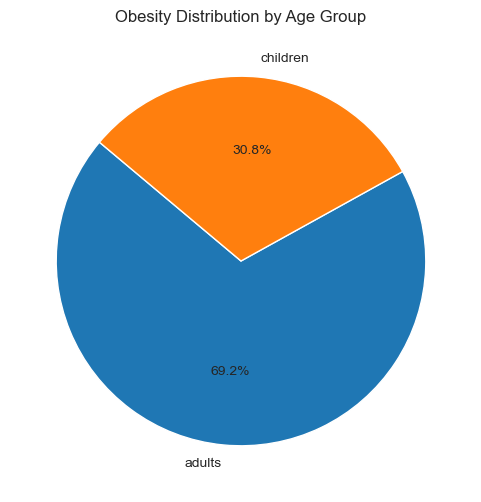

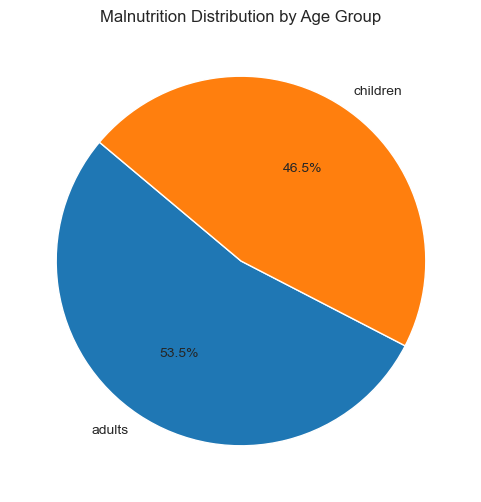

In [551]:
#Pie chart by Age group


# Group and average by age group
age_group_data = df_merged.groupby('age_group')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean()

# Pie Chart for Obesity by Age Group
plt.figure(figsize=(6,6))
plt.pie(age_group_data['Mean_Estimate_obesity'], labels=age_group_data.index, autopct='%1.1f%%', startangle=140)
plt.title('Obesity Distribution by Age Group')
plt.show()

# Pie Chart for Malnutrition by Age Group
plt.figure(figsize=(6,6))
plt.pie(age_group_data['Mean_Estimate_malnutrition'], labels=age_group_data.index, autopct='%1.1f%%', startangle=140)
plt.title('Malnutrition Distribution by Age Group')
plt.show()


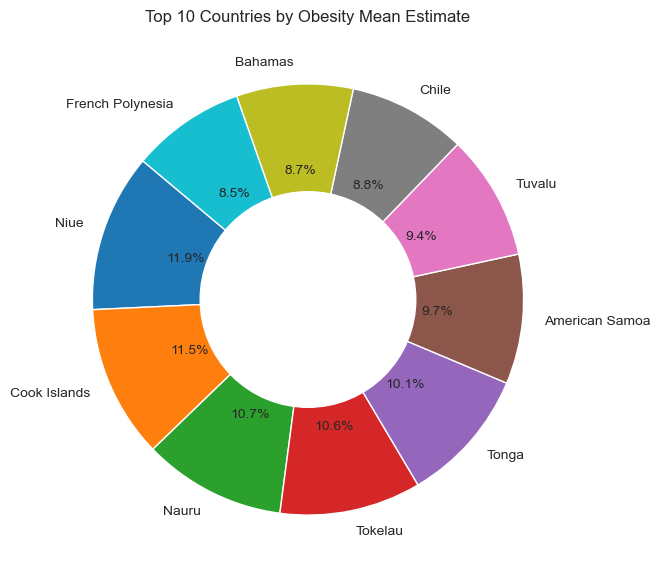

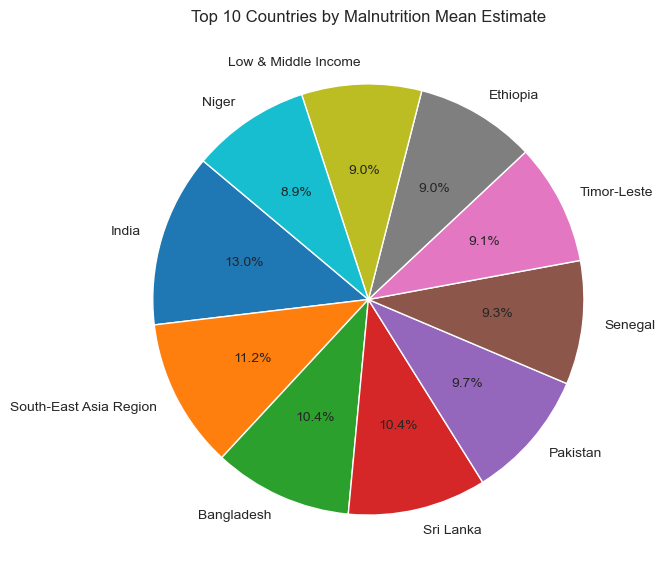

In [557]:
# pie chart by country wise

# Group and average by country, then take top 10
country_data = df_merged.groupby('Country')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean()

top10_obese = country_data['Mean_Estimate_obesity'].sort_values(ascending=False).head(10)
top10_malnutri = country_data['Mean_Estimate_malnutrition'].sort_values(ascending=False).head(10)

# Obesity Pie Chart by Country
plt.figure(figsize=(7,7))
plt.pie(top10_obese, labels=top10_obese.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Countries by Obesity Mean Estimate')
circle = plt.Circle((0,0), 0.50, fc = "white") # create circle
cur_plot = plt.gcf() # get current figure

cur_plot.gca().add_artist(circle)
plt.show()

# Malnutrition Pie Chart by Country
plt.figure(figsize=(7,7))
plt.pie(top10_malnutri, labels=top10_malnutri.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Countries by Malnutrition Mean Estimate')
plt.show()


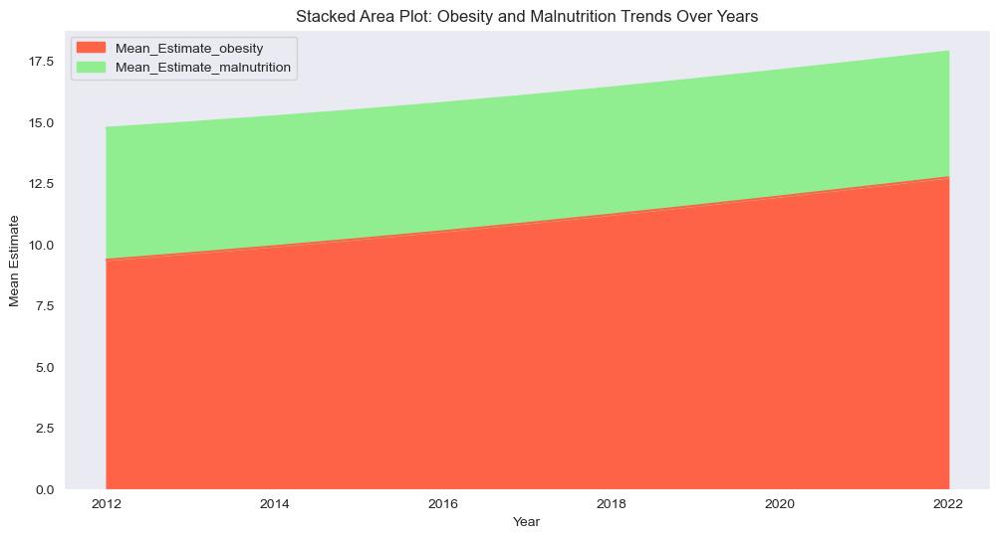

In [559]:
#Area plot

yearly = df_merged.groupby('Year')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean()

yearly.plot.area(figsize=(12,6), stacked=True, color=['tomato', 'lightgreen'])
plt.title('Stacked Area Plot: Obesity and Malnutrition Trends Over Years')
plt.ylabel('Mean Estimate')
plt.xlabel('Year')
plt.show()


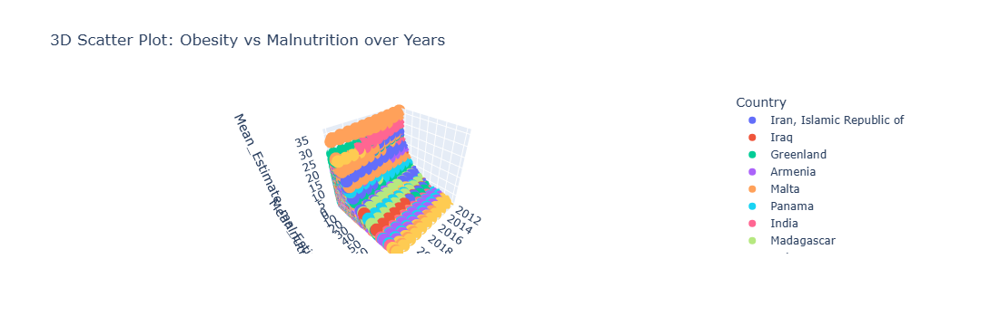

In [561]:
# 3D scatter plot

import plotly.express as px

fig = px.scatter_3d(df_merged,
                    x='Year',
                    y='Mean_Estimate_obesity',
                    z='Mean_Estimate_malnutrition',
                    color='Country',
                    title='3D Scatter Plot: Obesity vs Malnutrition over Years')

fig.show()


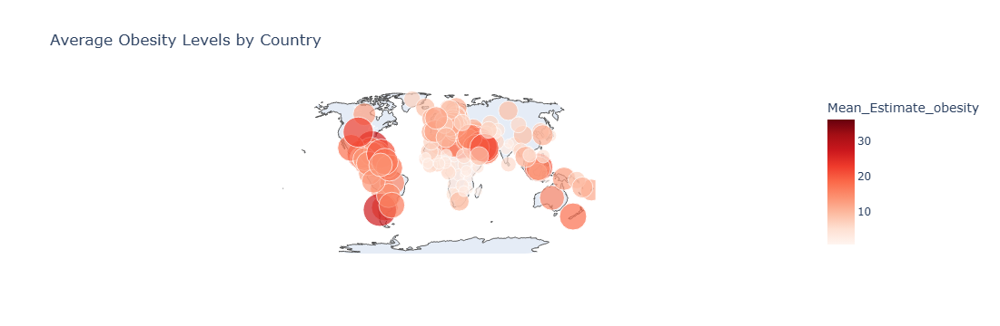

In [577]:
# Scatter map plot

#Obesity

df_merged['Mean_Estimate_obesity'] = pd.to_numeric(df_merged['Mean_Estimate_obesity'], errors='coerce')

df_obese_avg = df_merged.groupby('Country', as_index=False)['Mean_Estimate_obesity'].mean()

import plotly.express as px

fig = px.scatter_geo(
    df_obese_avg,
    locations='Country',
    locationmode='country names',
    color='Mean_Estimate_obesity',
    size='Mean_Estimate_obesity',
    projection='natural earth',
    title='Average Obesity Levels by Country',
    color_continuous_scale='Reds',
    hover_name='Country',
    size_max=30
)

fig.update_layout(geo=dict(showframe=False, showcoastlines=True))
fig.show()




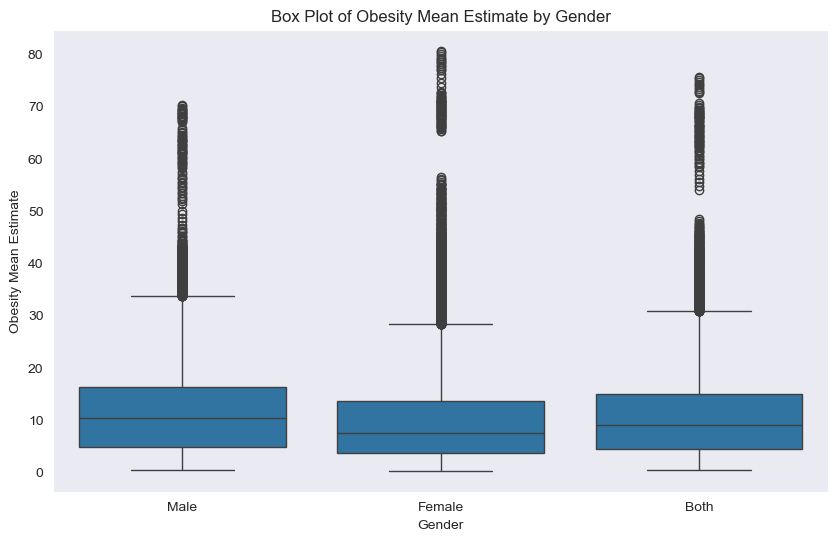

In [589]:
# Box plot

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_merged, x='Gender', y='Mean_Estimate_obesity')
plt.title("Box Plot of Obesity Mean Estimate by Gender")
plt.ylabel("Obesity Mean Estimate")
plt.xlabel("Gender")
plt.show()



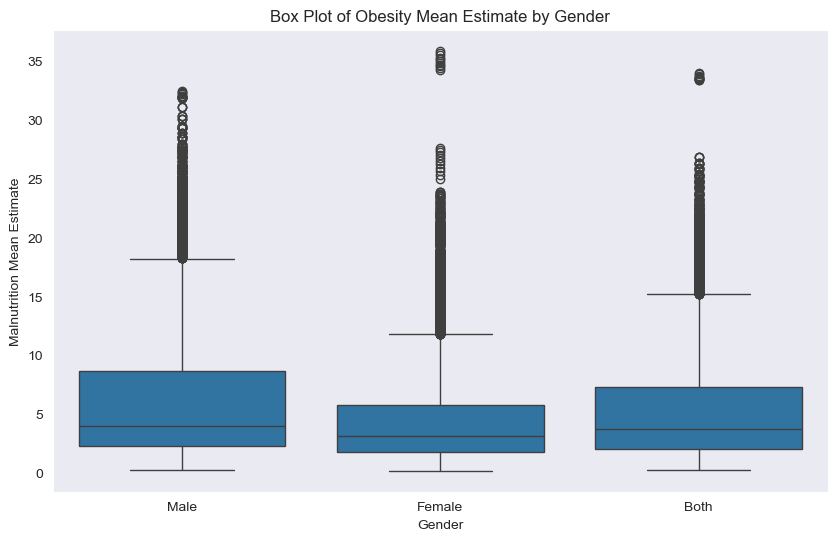

In [595]:


plt.figure(figsize=(10, 6))
sns.boxplot(data=df_merged, x='Gender', y='Mean_Estimate_malnutrition')
plt.title("Box Plot of Obesity Mean Estimate by Gender")
plt.ylabel("Malnutrition Mean Estimate")
plt.xlabel("Gender")
plt.show()



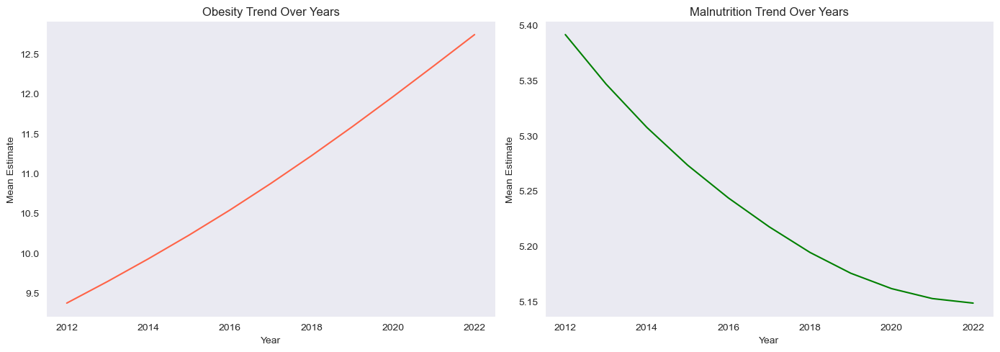

In [603]:
#subplots

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Subplot 1: Obesity
df_merged.groupby('Year')['Mean_Estimate_obesity'].mean().plot(ax=axes[0], kind='line', color='tomato')
axes[0].set_title("Obesity Trend Over Years")
axes[0].set_ylabel("Mean Estimate")
axes[0].set_xlabel("Year")

# Subplot 2: Malnutrition
df_merged.groupby('Year')['Mean_Estimate_malnutrition'].mean().plot(ax=axes[1], kind='line', color='green')
axes[1].set_title("Malnutrition Trend Over Years")
axes[1].set_ylabel("Mean Estimate")
axes[1].set_xlabel("Year")

plt.tight_layout()
plt.show()


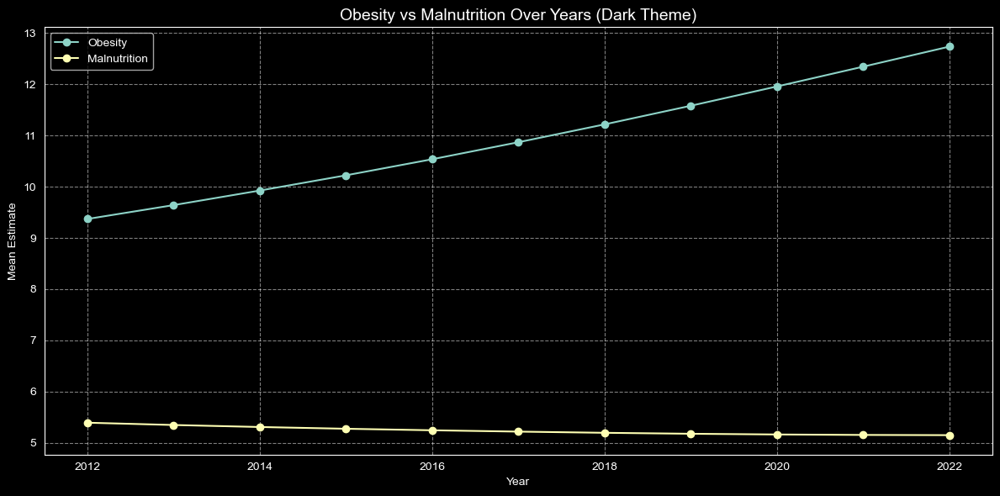

In [605]:
# Dark theme plot

plt.style.use('dark_background')  # Dark theme

df_merged.groupby('Year')[['Mean_Estimate_obesity', 'Mean_Estimate_malnutrition']].mean().plot(
    kind='line', figsize=(12, 6), marker='o'
)

plt.title("Obesity vs Malnutrition Over Years (Dark Theme)", fontsize=14)
plt.xlabel("Year")
plt.ylabel("Mean Estimate")
plt.legend(["Obesity", "Malnutrition"])
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



Insert Data into SQL

In [607]:
import mysql.connector as db # import packages 

In [611]:
connection = db.connect(
                        host = "localhost",
                        user = "root",
                        password = "1234",
                        database = "nutrition"
                       ) # connect

In [613]:
connection

In [615]:
cursor = connection.cursor() # create cursor to execute SQL queries

In [659]:
df_obese['Region'] = df_obese['Region'].fillna('Unknown') 

In [661]:
df_obese.isnull().sum()

Region           0
Gender           0
Year             0
LowerBound       0
UpperBound       0
Mean_Estimate    0
Country          0
age_group        0
CI_width         0
obesity_level    0
dtype: int64

In [653]:
df_malnutri['Region'] = df_malnutri['Region'].fillna('Unknown') 



In [657]:
df_malnutri.isnull().sum()

Region                0
Gender                0
Year                  0
LowerBound            0
UpperBound            0
Mean_Estimate         0
Country               0
age_group             0
CI_width              0
malnutrition_level    0
dtype: int64

In [663]:
# Create Obesity table to store obese info

cursor.execute ("""
create table obesity (
           Region VARCHAR(100),
           Gender VARCHAR(100),
           Year INT,
           LowerBound FLOAT,
           UpperBound FLOAT,
           Mean_Estimate FLOAT,
           Country VARCHAR(100),
           age_Group VARCHAR(50),
           CI_width FLOAT,
           obesity_Level VARCHAR(20)) """)

connection.commit() # to save the changes

In [665]:
# Create Malnutrition table to store obese info

cursor.execute ("""
create table malnutrition (
           Region VARCHAR(100),
           Gender VARCHAR(100),
           Year INT,
           LowerBound FLOAT,
           UpperBound FLOAT,
           Mean_Estimate FLOAT,
           Country VARCHAR(100),
           age_Group VARCHAR(50),
           CI_width FLOAT,
           malnutrition_Level VARCHAR(20)) """)

connection.commit() # to save the changes

In [667]:
#insert data to table

# Insert into obesity table
for index, row in df_obese.iterrows():
    cursor.execute("""
        INSERT INTO obesity (Year, Gender, Mean_Estimate, LowerBound, UpperBound, age_group,
                             Country, Region, CI_width, obesity_level)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
    """, (
        row['Year'], row['Gender'], row['Mean_Estimate'], row['LowerBound'], row['UpperBound'],
        row['age_group'], row['Country'], row['Region'], row['CI_width'], row['obesity_level']
    ))

connection.commit()


In [668]:
# Insert into malnutrition table
for index, row in df_malnutri.iterrows():
    cursor.execute("""
        INSERT INTO malnutrition (Year, Gender, Mean_Estimate, LowerBound, UpperBound, age_group,
                             Country, Region, CI_width, malnutrition_level)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
    """, (
        row['Year'], row['Gender'], row['Mean_Estimate'], row['LowerBound'], row['UpperBound'],
        row['age_group'], row['Country'], row['Region'], row['CI_width'], row['malnutrition_level']
    ))

connection.commit()